In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [4]:
annot_dir = '/Users/nieves/Downloads/FoodX251/annot'
train_info_path = '/Users/nieves/Downloads/FoodX251/annot/train_info.csv'
val_info_path = '/Users/nieves/Downloads/FoodX251/annot/val_info.csv'
class_list_path = '/Users/nieves/Downloads/FoodX251/annot/class_list.txt'

In [5]:
with open(class_list_path, 'r') as f:
    class_list = [line.strip() for line in f.readlines()]

train_info = pd.read_csv(train_info_path, header=None, names=['image', 'class'])
val_info = pd.read_csv(val_info_path, header=None, names=['image', 'class'])

In [6]:
print(train_info.head())
print(val_info.head())
print(class_list[:10])

              image  class
0  train_101733.jpg    211
1  train_101734.jpg    211
2  train_101735.jpg    211
3  train_101736.jpg    211
4  train_101737.jpg    211
            image  class
0  val_010323.jpg    247
1  val_010324.jpg    234
2  val_010325.jpg    222
3  val_010326.jpg    240
4  val_010327.jpg    218
['0 macaron', '1 beignet', '2 cruller', '3 cockle_food', '4 samosa', '5 tiramisu', '6 tostada', '7 moussaka', '8 dumpling', '9 sashimi']


In [7]:
train_dir = '/Users/nieves/Downloads/FoodX251/train_set'
val_dir = '/Users/nieves/Downloads/FoodX251/val_set'

# Data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,                # Normalize pixel values to [0, 1]
    rotation_range=30,             # Rotate image up to 30 degrees
    width_shift_range=0.2,         # Shift image horizontally up to 20%
    height_shift_range=0.2,        # Shift image vertically up to 20%
    shear_range=0.2,               # Shear transformation
    zoom_range=0.2,                # Zoom into images
    horizontal_flip=True           # Randomly flip images horizontally
)

# No augmentation for validation images
val_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=(224, 224),        # Resize to 224x224 (MobileNetV2 pretrained model uses 224x224 so we can use the same)
    batch_size=32,
    class_mode='categorical'       
)

val_generator = val_datagen.flow_from_directory(
    directory=val_dir,
    target_size=(224, 224),        
    batch_size=32,
    class_mode='categorical'       
)


Found 114154 images belonging to 251 classes.
Found 11994 images belonging to 251 classes.


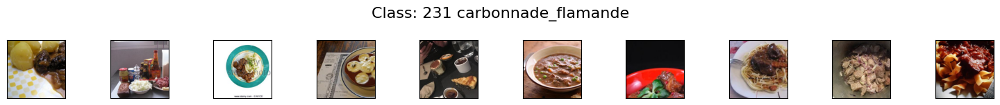

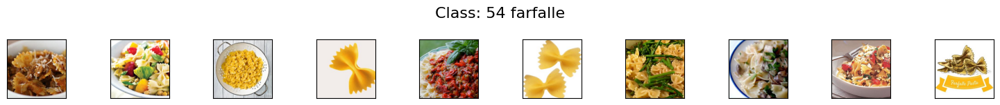

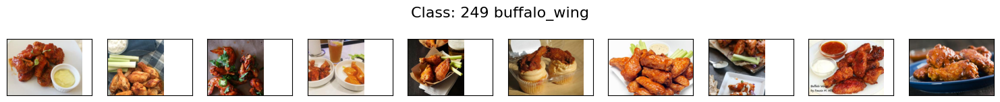

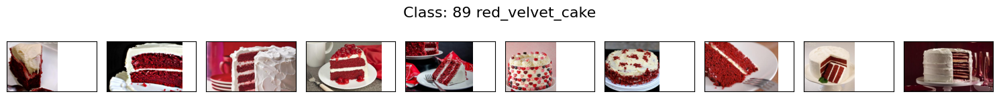

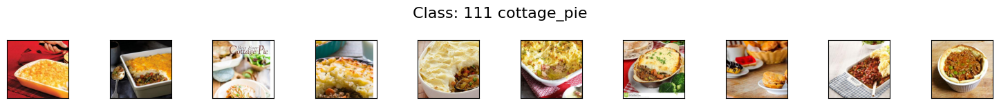

...

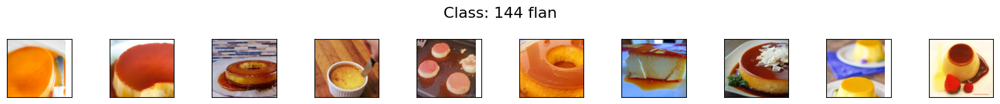

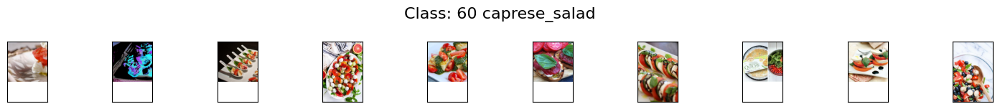

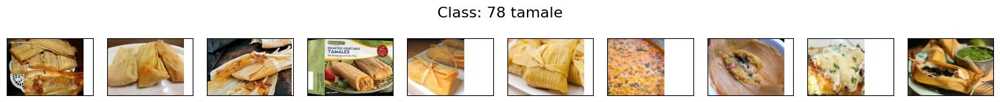

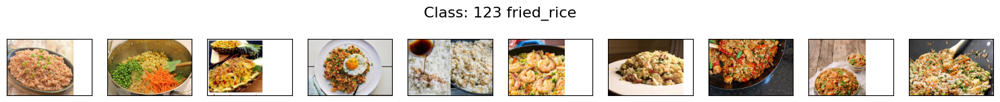

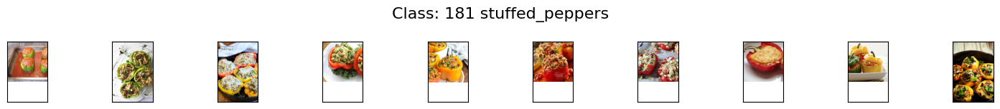

In [8]:
import os
import matplotlib.pyplot as plt
import numpy as np

train_dir = '/Users/nieves/Downloads/FoodX251/train_set'

class_labels = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

num_images_per_class = 10

# Iterate over each class
for class_label in class_labels[:75]:  # First 10 classes
    class_path = os.path.join(train_dir, class_label)
    # List image files, skipping non-image files
    image_files = [f for f in os.listdir(class_path) if not f.startswith('.')]  # Skip hidden files 
    image_files = image_files[:num_images_per_class]  # Get first num_images_per_class images
    
    # Create subplots for each class
    fig, ax = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 1.5), sharex=True, sharey=True)
    fig.suptitle(f"Class: {class_label}", fontsize=16)
    
    # Iterate over each image in the class
    for i, image_file in enumerate(image_files):
        image_path = os.path.join(class_path, image_file)
        image_data = plt.imread(image_path)
        
        # Plot image
        ax[i].imshow(image_data)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    
    plt.tight_layout()
    plt.show()


In [24]:
'''
import os
import shutil
import pandas as pd

# Paths to the dataset
base_dir = '/Users/nieves/Downloads/FoodX251'
train_info_path = os.path.join(base_dir, 'annot/train_info.csv')
val_info_path = os.path.join(base_dir, 'annot/val_info.csv')
train_dir = os.path.join(base_dir, 'train_set')
val_dir = os.path.join(base_dir, 'val_set')
class_list_path = os.path.join(base_dir, 'annot/class_list.txt')

# Load class list from the text file
with open(class_list_path, 'r') as f:
    class_list = [line.strip() for line in f]

def organize_images(info_csv, images_dir):
    # Load the CSV without headers and assign column names manually
    info_df = pd.read_csv(info_csv, header=None, names=['image', 'class'])

    # Loop over each image and class label pair
    for _, row in info_df.iterrows():
        image_name = row['image']
        class_id = int(row['class'])
        class_name = class_list[class_id]  # Get the class name from class_list
        
        # Create a folder for the class if it doesn't exist
        class_dir = os.path.join(images_dir, class_name)
        if not os.path.exists(class_dir):
            os.makedirs(class_dir)
        
        # Move the image to the correct class directory
        src_image_path = os.path.join(images_dir, image_name)
        dst_image_path = os.path.join(class_dir, image_name)
        
        if os.path.exists(src_image_path):
            shutil.move(src_image_path, dst_image_path)
        else:
            print(f"Warning: {src_image_path} not found!")

# Organize train and validation sets
organize_images(train_info_path, train_dir)
organize_images(val_info_path, val_dir)
'''

'\nimport os\nimport shutil\nimport pandas as pd\n\n# Paths to the dataset\nbase_dir = \'/Users/nieves/Downloads/FoodX251\'\ntrain_info_path = os.path.join(base_dir, \'annot/train_info.csv\')\nval_info_path = os.path.join(base_dir, \'annot/val_info.csv\')\ntrain_dir = os.path.join(base_dir, \'train_set\')\nval_dir = os.path.join(base_dir, \'val_set\')\nclass_list_path = os.path.join(base_dir, \'annot/class_list.txt\')\n\n# Load class list from the text file\nwith open(class_list_path, \'r\') as f:\n    class_list = [line.strip() for line in f]\n\ndef organize_images(info_csv, images_dir):\n    # Load the CSV without headers and assign column names manually\n    info_df = pd.read_csv(info_csv, header=None, names=[\'image\', \'class\'])\n\n    # Loop over each image and class label pair\n    for _, row in info_df.iterrows():\n        image_name = row[\'image\']\n        class_id = int(row[\'class\'])\n        class_name = class_list[class_id]  # Get the class name from class_list\n      

In [25]:
'''
import os
import pandas as pd

# Paths to the dataset
base_dir = '/Users/nieves/Downloads/FoodX251'
train_set_dir = os.path.join(base_dir, 'train_set')
incorrect_images_path = os.path.join(base_dir, 'annot/train_incorrect.csv')

# Load the train_incorrect.csv without headers and assign a column name
incorrect_images_df = pd.read_csv(incorrect_images_path, header=None, names=['image'])

# Loop over each image in the CSV
for _, row in incorrect_images_df.iterrows():
    image_name = row['image']
    
    # Traverse through all class directories in train_set
    for class_dir in os.listdir(train_set_dir):
        class_dir_path = os.path.join(train_set_dir, class_dir)
        
        # Check if the image exists in this class directory
        image_path = os.path.join(class_dir_path, image_name)
        if os.path.exists(image_path):
            os.remove(image_path)
            print(f"Removed: {image_path}")
            break  # Once the image is found and removed, stop searching further
    else:
        print(f"Image not found: {image_name}")

print("Removal process complete.")
'''

'\nimport os\nimport pandas as pd\n\n# Paths to the dataset\nbase_dir = \'/Users/nieves/Downloads/FoodX251\'\ntrain_set_dir = os.path.join(base_dir, \'train_set\')\nincorrect_images_path = os.path.join(base_dir, \'annot/train_incorrect.csv\')\n\n# Load the train_incorrect.csv without headers and assign a column name\nincorrect_images_df = pd.read_csv(incorrect_images_path, header=None, names=[\'image\'])\n\n# Loop over each image in the CSV\nfor _, row in incorrect_images_df.iterrows():\n    image_name = row[\'image\']\n    \n    # Traverse through all class directories in train_set\n    for class_dir in os.listdir(train_set_dir):\n        class_dir_path = os.path.join(train_set_dir, class_dir)\n        \n        # Check if the image exists in this class directory\n        image_path = os.path.join(class_dir_path, image_name)\n        if os.path.exists(image_path):\n            os.remove(image_path)\n            print(f"Removed: {image_path}")\n            break  # Once the image is fo